# Armenian Stone Inscription Text Line Detection Pipeline
## CS 260/371 Image Processing Project

**Project Goal:** Detect horizontal text lines in weathered Armenian stone inscriptions (khachkars, tapanakars) by exploiting the dominant vertical strokes characteristic of Armenian letters.

**Technical Approach:**
1. Detect vertical edges (letters)
2. Group them into dense regions (words/lines)
3. Find horizontal alignment (text lines)

**Reference:** Burger & Burge, "Digital Image Processing" (2nd ed., 2016), Chapters 5-10, 18-19

---
## Setup and Configuration

In [2]:
# Import required libraries
import numpy as np
import cv2
from scipy import ndimage
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage import morphology, measure, filters
from skimage.transform import hough_line, hough_line_peaks
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Configure matplotlib for better display
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (12, 8)

print("✓ All libraries imported successfully")

✓ All libraries imported successfully


In [3]:
# Configuration paths
IMAGE_DIR = Path('../Images')
RESULTS_DIR = Path('../Results')

# Verify directories exist
assert IMAGE_DIR.exists(), f"Images directory not found: {IMAGE_DIR}"
assert RESULTS_DIR.exists(), f"Results directory not found: {RESULTS_DIR}"

print(f"✓ Images directory: {IMAGE_DIR.absolute()}")
print(f"✓ Results directory: {RESULTS_DIR.absolute()}")

✓ Images directory: /Users/narekmeloyan/PycharmProjects/ImageProcessingProject1/Images
✓ Results directory: /Users/narekmeloyan/PycharmProjects/ImageProcessingProject1/Results


In [4]:
# Global parameters (tunable)
PARAMS = {
    'edge_threshold': 30,           # Edge detection threshold (20-50)
    'bandpass_large': 40,            # Large structure cutoff (pixels)
    'bandpass_small': 3,             # Small structure cutoff (pixels)
    'min_particle_size': 100,        # Minimum particle area
    'median_kernel_size': 3,         # Denoising kernel size
    'hough_threshold_percentile': 90,# Hough peak detection
    'morphology_iterations': 1,      # Morphological operations iterations
    'hough_num_peaks': 20            # Maximum number of lines to detect
}

print("Configuration Parameters:")
for key, value in PARAMS.items():
    print(f"  {key}: {value}")

Configuration Parameters:
  edge_threshold: 30
  bandpass_large: 40
  bandpass_small: 3
  min_particle_size: 100
  median_kernel_size: 3
  hough_threshold_percentile: 90
  morphology_iterations: 1
  hough_num_peaks: 20


---
## Utility Functions

In [5]:
def load_image(filepath, grayscale=True):
    """
    Load image and optionally convert to grayscale
    
    Args:
        filepath: Path to image file
        grayscale: If True, convert to grayscale
    
    Returns:
        img: numpy array (H, W) if grayscale, (H, W, 3) if color
    """
    img = cv2.imread(str(filepath))
    if img is None:
        raise ValueError(f"Could not load image: {filepath}")
    
    # Convert BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if grayscale:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    return img

def save_image(img, filepath):
    """
    Save image to disk
    
    Args:
        img: Image array
        filepath: Destination path
    """
    filepath = Path(filepath)
    filepath.parent.mkdir(parents=True, exist_ok=True)
    
    if len(img.shape) == 2:  # Grayscale
        cv2.imwrite(str(filepath), img)
    else:  # Color (RGB)
        cv2.imwrite(str(filepath), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

def binarize(img, threshold=127):
    """
    Convert grayscale to binary
    
    Args:
        img: Grayscale image
        threshold: Binarization threshold
    
    Returns:
        Binary image (0 or 255)
    """
    return (img > threshold).astype(np.uint8) * 255

print("✓ Utility functions defined")

✓ Utility functions defined


In [6]:
def show_image(img, title='Image', cmap='gray', figsize=(10, 8)):
    """
    Display single image with title
    """
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap=cmap)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def show_images_grid(images, titles, cols=3, figsize=(15, 10), cmap='gray'):
    """
    Display multiple images in a grid
    """
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    # Handle single subplot case
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=10, fontweight='bold')
        ax.axis('off')
    
    # Hide unused subplots
    for ax in axes[len(images):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

print("✓ Visualization functions defined")

✓ Visualization functions defined


---
## Step 0: Load Images

Found 3 images:
  ✓ Image1.png: (768, 1369)
  ✓ Image3.jpg: (460, 690)
  ✓ Image4.jpg: (427, 640)


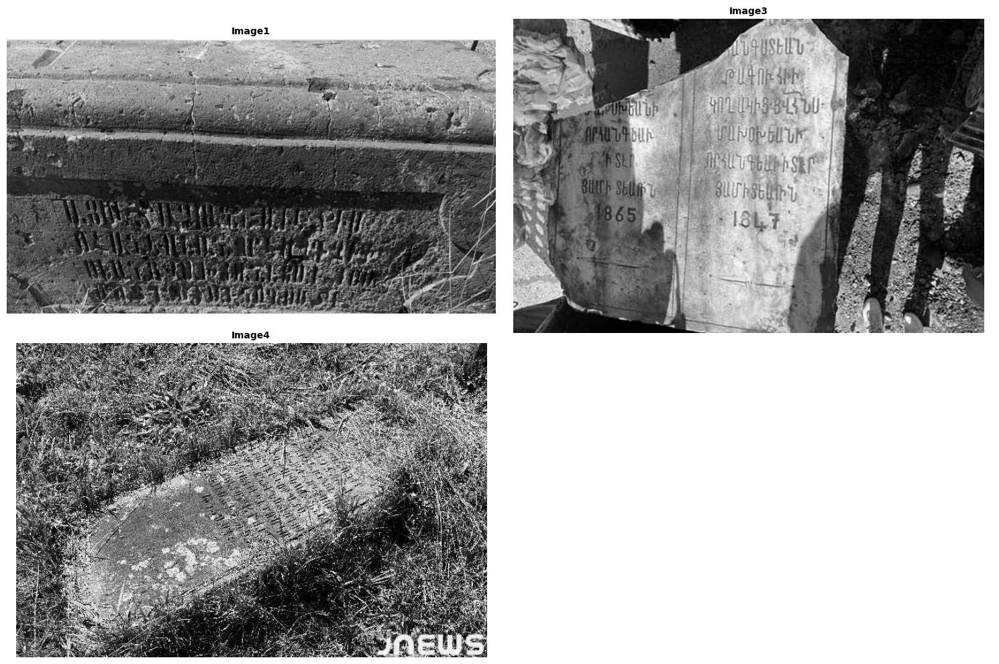

In [7]:
def load_all_images(image_dir):
    """
    Load all images from directory
    
    Args:
        image_dir: Path to images directory
    
    Returns:
        Dictionary mapping filename to grayscale image array
    """
    images = {}
    
    # Find all image files
    image_files = sorted(list(image_dir.glob('*.jpg')) + 
                        list(image_dir.glob('*.png')) + 
                        list(image_dir.glob('*.tif')))
    
    print(f"Found {len(image_files)} images:")
    
    for filepath in image_files:
        img = load_image(filepath, grayscale=True)
        images[filepath.stem] = img
        print(f"  ✓ {filepath.name}: {img.shape}")
    
    return images

# Load all images
images = load_all_images(IMAGE_DIR)

# Display loaded images
if images:
    img_list = list(images.values())
    title_list = list(images.keys())
    show_images_grid(img_list, title_list, cols=2, figsize=(15, 10))
else:
    print("⚠ No images found!")

---
## Step 1: Image Preprocessing

Images are already converted to grayscale. We can optionally apply preprocessing here.

---
## Step 2: Vertical Edge Detection

**Algorithm:** Sobel operator with horizontal gradient

**Key Insight:** Armenian letters are based on vertical strokes, so we detect vertical edges using horizontal gradients.

- **East edges:** Light-to-dark transitions (positive gradient)
- **West edges:** Dark-to-light transitions (negative gradient)

In [8]:
def detect_vertical_edges(img, threshold=30):
    """
    Detect vertical edges using Sobel operator
    
    Args:
        img: Grayscale image (H, W)
        threshold: Edge detection threshold
    
    Returns:
        east_edges: Binary image of east edges
        west_edges: Binary image of west edges
        combined_edges: Binary image of all vertical edges
    """
    # Sobel kernels for horizontal gradient (detects vertical edges)
    sobel_east = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ], dtype=np.float32)
    
    sobel_west = np.array([
        [1, 0, -1],
        [2, 0, -2],
        [1, 0, -1]
    ], dtype=np.float32)
    
    # Convolve with kernels
    east_response = cv2.filter2D(img, -1, sobel_east)
    west_response = cv2.filter2D(img, -1, sobel_west)
    
    # Compute magnitude and threshold
    east_magnitude = np.abs(east_response)
    west_magnitude = np.abs(west_response)
    
    # Binarize
    east_edges = (east_magnitude > threshold).astype(np.uint8) * 255
    west_edges = (west_magnitude > threshold).astype(np.uint8) * 255
    
    # Combine with OR operation
    combined_edges = cv2.bitwise_or(east_edges, west_edges)
    
    return east_edges, west_edges, combined_edges

print("✓ Step 2 function defined")

✓ Step 2 function defined


---
## Step 3: Morphological Enhancement

**Goal:** Connect nearby vertical strokes horizontally, remove horizontal noise

- **Horizontal dilation:** Expands edges horizontally (connects letters into words)
- **Vertical erosion:** Shrinks edges vertically (removes noise)

In [9]:
def morphological_enhancement(img, iterations=1):
    """
    Apply horizontal dilation followed by vertical erosion
    
    Args:
        img: Binary image (H, W)
        iterations: Number of iterations for morphological operations
    
    Returns:
        enhanced: Morphologically enhanced binary image
    """
    # Define structuring elements
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 1))
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 3))
    
    # Horizontal dilation (expands horizontally)
    dilated = cv2.dilate(img, horizontal_kernel, iterations=iterations)
    
    # Vertical erosion (shrinks vertically)
    enhanced = cv2.erode(dilated, vertical_kernel, iterations=iterations)
    
    return enhanced

print("✓ Step 3 function defined")

✓ Step 3 function defined


---
## Step 4: Denoising with Binary Preservation

**Critical:** Must maintain binary (0 or 255) values after filtering

In [10]:
def denoise_binary(img, method='median', kernel_size=3):
    """
    Denoise binary image while preserving binary nature
    
    Args:
        img: Binary image (H, W)
        method: 'median', 'gaussian', or 'opening'
        kernel_size: Filter kernel size (odd number)
    
    Returns:
        denoised: Binary denoised image
    """
    if method == 'median':
        # Apply median filter
        filtered = cv2.medianBlur(img, kernel_size)
        # Re-binarize (CRITICAL!)
        denoised = binarize(filtered, threshold=127)
    
    elif method == 'gaussian':
        # Apply Gaussian blur
        filtered = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
        # Re-binarize
        denoised = binarize(filtered, threshold=127)
    
    elif method == 'opening':
        # Morphological opening (erosion + dilation)
        kernel = np.ones((kernel_size, kernel_size), np.uint8)
        denoised = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    
    else:
        raise ValueError(f"Unknown method: {method}")
    
    return denoised

print("✓ Step 4 function defined")

✓ Step 4 function defined


---
## Step 5: Bandpass Filter (Frequency Domain)

**Goal:** Remove background gradients (low freq) and pixel noise (high freq)

**Method:** FFT → Bandpass Mask → Inverse FFT

In [11]:
def bandpass_filter(img, filter_large=40, filter_small=3):
    """
    Apply bandpass filter in frequency domain
    
    Args:
        img: Grayscale or binary image (H, W)
        filter_large: Large structure size to filter (pixels)
        filter_small: Small structure size to filter (pixels)
    
    Returns:
        filtered: Bandpass filtered image
    """
    # Convert to float
    img_float = img.astype(np.float32)
    
    # Compute 2D FFT
    fft = fft2(img_float)
    fft_shift = fftshift(fft)  # Center DC component
    
    # Get image dimensions
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2
    
    # Create bandpass mask
    mask = np.zeros((rows, cols), np.float32)
    
    # Calculate frequency cutoffs
    low_cutoff = min(rows, cols) / (2 * filter_large)
    high_cutoff = min(rows, cols) / (2 * filter_small)
    
    for i in range(rows):
        for j in range(cols):
            # Distance from center (frequency magnitude)
            dist = np.sqrt((i - crow)**2 + (j - ccol)**2)
            
            # Bandpass: 1 if within range, 0 otherwise
            if low_cutoff < dist < high_cutoff:
                mask[i, j] = 1.0
    
    # Apply mask in frequency domain
    fft_filtered = fft_shift * mask
    
    # Inverse FFT
    fft_ishift = ifftshift(fft_filtered)
    img_filtered = ifft2(fft_ishift)
    img_filtered = np.real(img_filtered)
    
    # Normalize to 0-255 range
    img_filtered = img_filtered - img_filtered.min()
    img_filtered = img_filtered / img_filtered.max() * 255
    img_filtered = np.clip(img_filtered, 0, 255)
    img_filtered = img_filtered.astype(np.uint8)
    
    return img_filtered

print("✓ Step 5 function defined")

✓ Step 5 function defined


---
## Steps 6-7: Binary Masking and Second Bandpass (Optional)

In [12]:
def apply_binary_mask(edges, bandpass_result):
    """
    Apply bandpass result as mask for vertical edges
    
    Args:
        edges: Binary edges from Step 4
        bandpass_result: Bandpass filtered image from Step 5
    
    Returns:
        masked: Combined result
    """
    # Binarize bandpass result
    bandpass_binary = binarize(bandpass_result, threshold=127)
    
    # Apply AND operation
    masked = cv2.bitwise_and(edges, bandpass_binary)
    
    return masked

print("✓ Steps 6-7 function defined")

✓ Steps 6-7 function defined


---
## Step 8: Particle Analysis with Ellipse Fitting

**Goal:** Identify text regions and characterize their shape

In [13]:
def analyze_particles(img, min_size=100):
    """
    Analyze particles and fit ellipses
    
    Args:
        img: Binary image (H, W)
        min_size: Minimum particle area
    
    Returns:
        labeled: Labeled image with unique IDs
        particles: List of particle properties
        ellipses: List of fitted ellipse parameters
    """
    # Label connected components
    labeled = measure.label(img, connectivity=2)
    
    # Get region properties
    regions = measure.regionprops(labeled)
    
    particles = []
    ellipses = []
    
    for region in regions:
        # Filter by size
        if region.area < min_size:
            continue
        
        # Extract properties
        particle = {
            'label': region.label,
            'area': region.area,
            'centroid': region.centroid,
            'bbox': region.bbox,
            'major_axis': region.major_axis_length,
            'minor_axis': region.minor_axis_length,
            'orientation': region.orientation
        }
        particles.append(particle)
        
        # Ellipse parameters
        ellipse = {
            'center': (region.centroid[1], region.centroid[0]),  # (x, y)
            'width': region.minor_axis_length,
            'height': region.major_axis_length,
            'angle': np.degrees(region.orientation)
        }
        ellipses.append(ellipse)
    
    return labeled, particles, ellipses

def draw_ellipses(img, ellipses):
    """
    Draw fitted ellipses on image
    """
    # Convert to RGB if grayscale
    if len(img.shape) == 2:
        output = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        output = img.copy()
    
    # Draw each ellipse
    for ellipse in ellipses:
        center = tuple(map(int, ellipse['center']))
        axes = (int(ellipse['width']/2), int(ellipse['height']/2))
        angle = ellipse['angle']
        
        cv2.ellipse(output, center, axes, angle, 0, 360, (255, 0, 0), 2)
    
    return output

print("✓ Step 8 functions defined")

✓ Step 8 functions defined


---
## Step 9: Skeletonization

**Goal:** Reduce regions to 1-pixel-wide centerlines

In [14]:
def skeletonize_image(img):
    """
    Skeletonize binary image
    
    Args:
        img: Binary image (H, W)
    
    Returns:
        skeleton: Skeletonized image
    """
    # Convert to boolean
    binary = img > 0
    
    # Skeletonize using scikit-image
    skeleton = morphology.skeletonize(binary)
    
    # Convert back to uint8
    skeleton = (skeleton * 255).astype(np.uint8)
    
    return skeleton

print("✓ Step 9 function defined")

✓ Step 9 function defined


---
## Steps 10-11: Hough Transform for Line Detection

**Goal:** Detect horizontal lines (text lines) in parameter space

**Focus:** θ ≈ 90° indicates horizontal lines

In [15]:
def hough_transform_lines(img, theta_resolution=1):
    """
    Apply Hough transform to detect lines
    
    Args:
        img: Binary edge image (H, W)
        theta_resolution: Angular resolution in degrees
    
    Returns:
        hough_space: Hough accumulator array
        angles: Array of theta values (radians)
        distances: Array of rho values
    """
    # Define theta range (0 to 180 degrees)
    thetas = np.deg2rad(np.arange(0, 180, theta_resolution))
    
    # Compute Hough transform
    hough_space, angles, distances = hough_line(img, theta=thetas)
    
    return hough_space, angles, distances

def find_hough_peaks(hough_space, angles, distances, num_peaks=20, angle_range=(80, 100)):
    """
    Find peaks in Hough space (detected lines)
    
    Args:
        hough_space: Accumulator array
        angles: Theta values (radians)
        distances: Rho values
        num_peaks: Maximum number of peaks
        angle_range: (min, max) angle range in degrees
    
    Returns:
        detected_lines: List of line dictionaries
    """
    # Convert angle range to indices
    angle_deg = np.rad2deg(angles)
    angle_mask = (angle_deg >= angle_range[0]) & (angle_deg <= angle_range[1])
    
    # Find peaks using scikit-image
    h, theta, d = hough_line_peaks(
        hough_space, angles, distances,
        num_peaks=num_peaks,
        threshold=None
    )
    
    # Filter for horizontal lines and create line dictionaries
    detected_lines = []
    for votes, angle, rho in zip(h, theta, d):
        angle_deg_val = np.rad2deg(angle)
        if angle_range[0] <= angle_deg_val <= angle_range[1]:
            detected_lines.append({
                'rho': rho,
                'theta': angle,
                'votes': votes
            })
    
    return detected_lines

print("✓ Steps 10-11 functions defined")

✓ Steps 10-11 functions defined


---
## Step 12: Line Overlay on Original Image

In [16]:
def draw_hough_lines(img, lines, color=(0, 255, 0), thickness=2):
    """
    Draw detected Hough lines on image
    
    Args:
        img: Original image
        lines: List of line parameters (dicts with 'rho' and 'theta')
        color: Line color (R, G, B)
        thickness: Line thickness
    
    Returns:
        output: Image with lines drawn
    """
    # Convert to RGB if grayscale
    if len(img.shape) == 2:
        output = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        output = img.copy()
    
    h, w = output.shape[:2]
    
    # Draw each line
    for line in lines:
        rho = line['rho']
        theta = line['theta']
        
        # Convert polar to Cartesian coordinates
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        
        # Calculate line endpoints (extend across image)
        x1 = int(x0 + 2000 * (-b))
        y1 = int(y0 + 2000 * a)
        x2 = int(x0 - 2000 * (-b))
        y2 = int(y0 - 2000 * a)
        
        # Draw line
        cv2.line(output, (x1, y1), (x2, y2), color, thickness)
    
    return output

print("✓ Step 12 function defined")

✓ Step 12 function defined


---
## Step 13: Horizontal Projection Profile and Boundary Detection

**Goal:** Refine line boundaries by finding valleys (gaps) between text lines

In [17]:
def compute_horizontal_projection(img):
    """
    Compute horizontal projection profile
    
    Args:
        img: Binary image (H, W)
    
    Returns:
        projection: 1D array (sum for each row)
    """
    projection = np.sum(img > 0, axis=1)
    return projection

def find_projection_valleys(projection, peak_positions, search_window=50):
    """
    Find valley positions (minima) around each peak
    
    Args:
        projection: Horizontal projection array
        peak_positions: List of detected line centers (y-coordinates)
        search_window: Pixels to search above/below peak
    
    Returns:
        boundaries: List of (top, bottom) tuples
    """
    boundaries = []
    
    for peak_y in peak_positions:
        # Ensure peak_y is valid
        if peak_y < 0 or peak_y >= len(projection):
            continue
        
        # Search upward for minimum
        search_start = max(0, peak_y - search_window)
        search_end = peak_y
        top_region = projection[search_start:search_end]
        
        if len(top_region) > 0:
            top_boundary = search_start + np.argmin(top_region)
        else:
            top_boundary = peak_y
        
        # Search downward for minimum
        search_start = peak_y
        search_end = min(len(projection), peak_y + search_window)
        bottom_region = projection[search_start:search_end]
        
        if len(bottom_region) > 0:
            bottom_boundary = search_start + np.argmin(bottom_region)
        else:
            bottom_boundary = peak_y
        
        boundaries.append((top_boundary, bottom_boundary))
    
    return boundaries

def draw_text_line_boundaries(img, boundaries, color=(0, 255, 0), thickness=2):
    """
    Draw top and bottom boundaries for each text line
    
    Args:
        img: Original image
        boundaries: List of (top, bottom) tuples
        color: Boundary line color (R, G, B)
        thickness: Line thickness
    
    Returns:
        output: Image with boundaries drawn
    """
    # Convert to RGB if grayscale
    if len(img.shape) == 2:
        output = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        output = img.copy()
    
    w = output.shape[1]
    
    # Draw each boundary
    for top, bottom in boundaries:
        # Top boundary in green
        cv2.line(output, (0, top), (w, top), color, thickness)
        # Bottom boundary in red
        cv2.line(output, (0, bottom), (w, bottom), (255, 0, 0), thickness)
    
    return output

print("✓ Step 13 functions defined")

✓ Step 13 functions defined


---
## Master Pipeline Function

This function integrates all steps and processes a single image through the complete pipeline.

In [18]:
def process_image_pipeline(img, image_name, params=PARAMS, save_steps=True):
    """
    Run complete pipeline on single image
    
    Args:
        img: Input grayscale image
        image_name: Name for saving outputs
        params: Dictionary of parameters
        save_steps: If True, save intermediate results
    
    Returns:
        results: Dictionary containing all intermediate and final results
    """
    results = {'original': img}
    
    print(f"\n{'='*70}")
    print(f"Processing: {image_name}")
    print(f"{'='*70}\n")
    
    # Step 2: Edge Detection
    print("Step 2: Detecting vertical edges...")
    east, west, edges = detect_vertical_edges(
        img, threshold=params['edge_threshold']
    )
    results['east_edges'] = east
    results['west_edges'] = west
    results['edges'] = edges
    if save_steps:
        save_image(east, RESULTS_DIR / 'step2_edges' / f"{image_name}_east.png")
        save_image(west, RESULTS_DIR / 'step2_edges' / f"{image_name}_west.png")
        save_image(edges, RESULTS_DIR / 'step2_edges' / f"{image_name}_combined.png")
    
    # Step 3: Morphological Enhancement
    print("Step 3: Morphological enhancement...")
    morphed = morphological_enhancement(edges, iterations=params['morphology_iterations'])
    results['morphed'] = morphed
    if save_steps:
        save_image(morphed, RESULTS_DIR / 'step3_morphology' / f"{image_name}_morphed.png")
    
    # Step 4: Denoising
    print("Step 4: Denoising...")
    denoised = denoise_binary(morphed, method='median', kernel_size=params['median_kernel_size'])
    results['denoised'] = denoised
    if save_steps:
        save_image(denoised, RESULTS_DIR / 'step4_denoising' / f"{image_name}_denoised.png")
    
    # Step 5: Bandpass Filter
    print("Step 5: Applying bandpass filter...")
    bandpass = bandpass_filter(
        denoised, 
        filter_large=params['bandpass_large'],
        filter_small=params['bandpass_small']
    )
    results['bandpass'] = bandpass
    if save_steps:
        save_image(bandpass, RESULTS_DIR / 'step5_bandpass' / f"{image_name}_bandpass.png")
    
    # Step 6-7: Masking (optional)
    print("Step 6-7: Binary masking...")
    masked = apply_binary_mask(denoised, bandpass)
    results['masked'] = masked
    if save_steps:
        save_image(masked, RESULTS_DIR / 'step6_masking' / f"{image_name}_masked.png")
    
    # Step 8: Particle Analysis
    print("Step 8: Analyzing particles...")
    labeled, particles, ellipses = analyze_particles(
        bandpass, min_size=params['min_particle_size']
    )
    results['particles'] = particles
    results['ellipses'] = ellipses
    ellipse_img = draw_ellipses(img, ellipses)
    results['ellipse_img'] = ellipse_img
    if save_steps:
        save_image(ellipse_img, RESULTS_DIR / 'step8_particles' / f"{image_name}_ellipses.png")
    print(f"  Found {len(particles)} particles")
    
    # Step 9: Skeletonization
    print("Step 9: Skeletonizing...")
    skeleton = skeletonize_image(bandpass)
    results['skeleton'] = skeleton
    if save_steps:
        save_image(skeleton, RESULTS_DIR / 'step9_skeleton' / f"{image_name}_skeleton.png")
    
    # Step 10-11: Hough Transform
    print("Step 10-11: Hough transform...")
    hough_space, angles, distances = hough_transform_lines(skeleton)
    detected_lines = find_hough_peaks(
        hough_space, angles, distances,
        num_peaks=params['hough_num_peaks'],
        angle_range=(80, 100)
    )
    results['hough_space'] = hough_space
    results['detected_lines'] = detected_lines
    print(f"  Detected {len(detected_lines)} horizontal lines")
    
    # Step 12: Line Overlay
    print("Step 12: Drawing detected lines...")
    line_overlay = draw_hough_lines(img, detected_lines, color=(0, 255, 0), thickness=2)
    results['line_overlay'] = line_overlay
    if save_steps:
        save_image(line_overlay, RESULTS_DIR / 'step12_lines' / f"{image_name}_lines.png")
    
    # Step 13: Projection Profile
    print("Step 13: Computing projection profile...")
    projection = compute_horizontal_projection(denoised)
    
    # Extract y-coordinates from detected lines
    line_positions = [int(line['rho']) for line in detected_lines 
                     if 80 <= np.rad2deg(line['theta']) <= 100]
    
    boundaries = find_projection_valleys(projection, line_positions, search_window=50)
    boundary_img = draw_text_line_boundaries(img, boundaries, color=(0, 255, 0), thickness=2)
    results['projection'] = projection
    results['boundaries'] = boundaries
    results['boundary_img'] = boundary_img
    if save_steps:
        save_image(boundary_img, RESULTS_DIR / 'step13_boundaries' / f"{image_name}_boundaries.png")
    print(f"  Found {len(boundaries)} text line boundaries")
    
    print(f"\n{'='*70}")
    print(f"Completed: {image_name}")
    print(f"  - {len(detected_lines)} lines detected")
    print(f"  - {len(boundaries)} boundaries found")
    print(f"  - {len(particles)} particles analyzed")
    print(f"{'='*70}\n")
    
    return results

print("✓ Master pipeline function defined")

✓ Master pipeline function defined


---
## Process All Images

Run the complete pipeline on all loaded images.

In [19]:
# Process all images
all_results = {}

for image_name, img in images.items():
    results = process_image_pipeline(img, image_name, params=PARAMS, save_steps=True)
    all_results[image_name] = results

print("\n" + "="*70)
print("ALL IMAGES PROCESSED SUCCESSFULLY!")
print("="*70)


Processing: Image1

Step 2: Detecting vertical edges...
Step 3: Morphological enhancement...
Step 4: Denoising...
Step 5: Applying bandpass filter...
Step 6-7: Binary masking...
Step 8: Analyzing particles...
  Found 0 particles
Step 9: Skeletonizing...
Step 10-11: Hough transform...
  Detected 1 horizontal lines
Step 12: Drawing detected lines...
Step 13: Computing projection profile...
  Found 1 text line boundaries

Completed: Image1
  - 1 lines detected
  - 1 boundaries found
  - 0 particles analyzed


Processing: Image3

Step 2: Detecting vertical edges...
Step 3: Morphological enhancement...
Step 4: Denoising...
Step 5: Applying bandpass filter...
Step 6-7: Binary masking...
Step 8: Analyzing particles...
  Found 0 particles
Step 9: Skeletonizing...
Step 10-11: Hough transform...
  Detected 1 horizontal lines
Step 12: Drawing detected lines...
Step 13: Computing projection profile...
  Found 1 text line boundaries

Completed: Image3
  - 1 lines detected
  - 1 boundaries found
  

---
## Visualization: Step-by-Step Results for First Image

Detailed visualization for: Image1

Step 2: Vertical Edge Detection


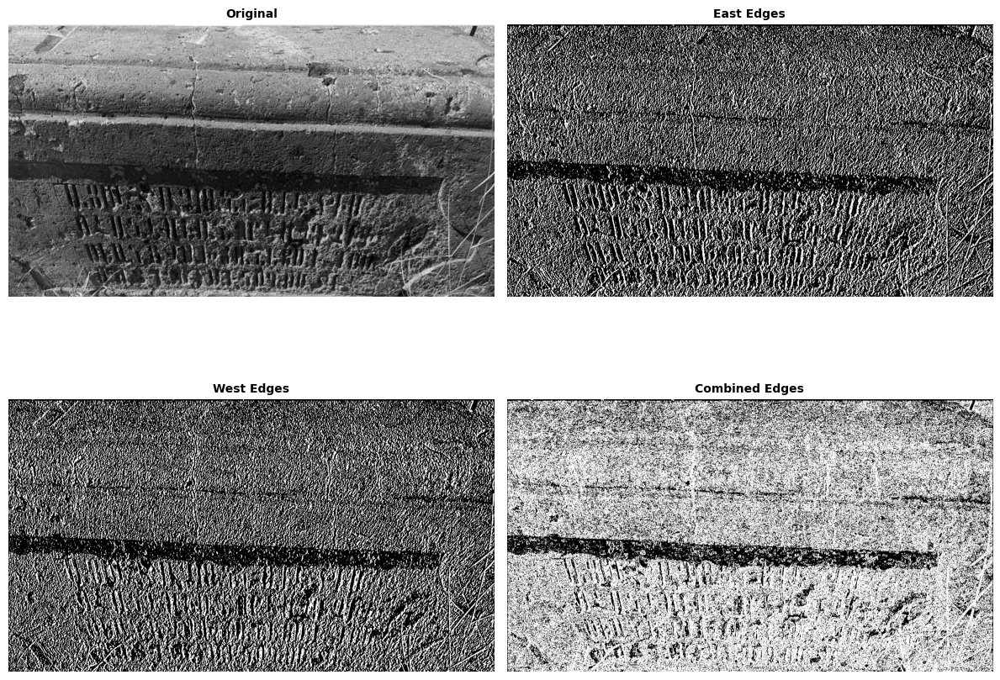

Steps 3-4: Morphological Enhancement and Denoising


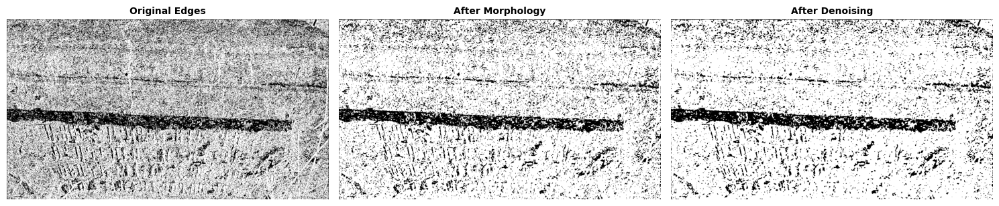

Step 5: Bandpass Filter


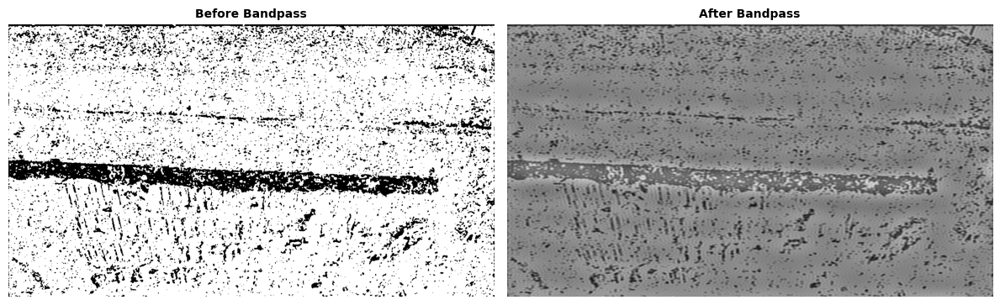

Step 8: Particle Analysis with Ellipse Fitting


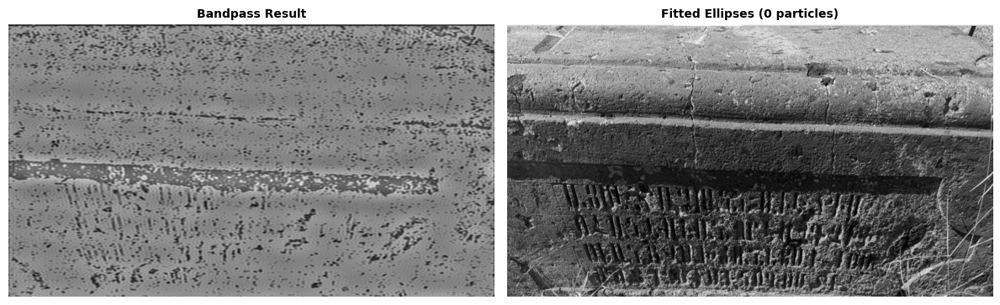

Step 9: Skeletonization


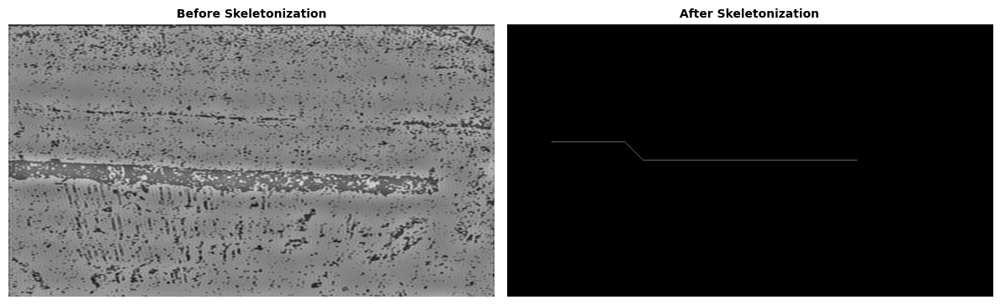

Step 12: Detected Lines Overlay


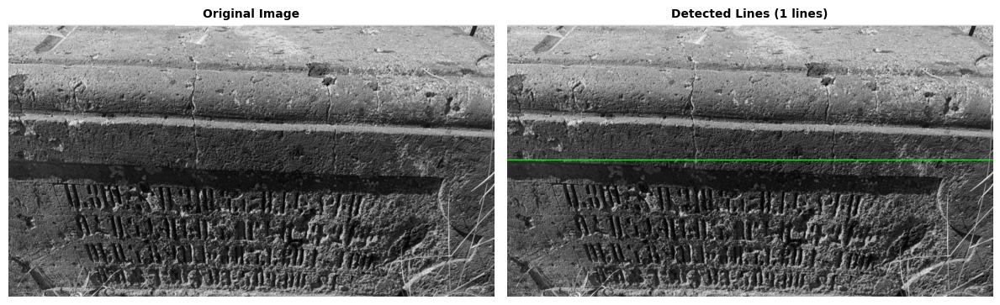

Step 13: Text Line Boundaries


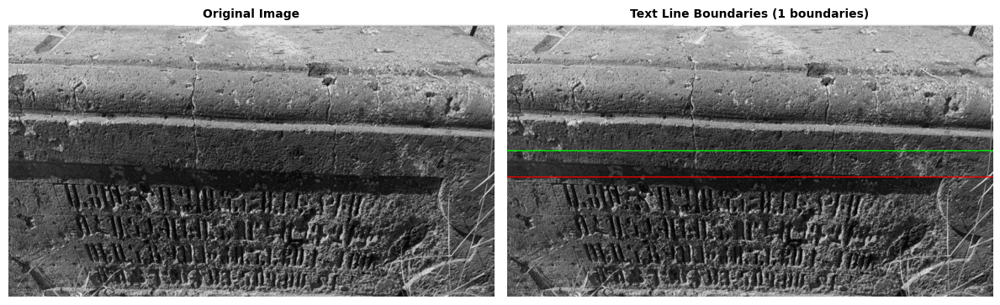

Step 13: Horizontal Projection Profile


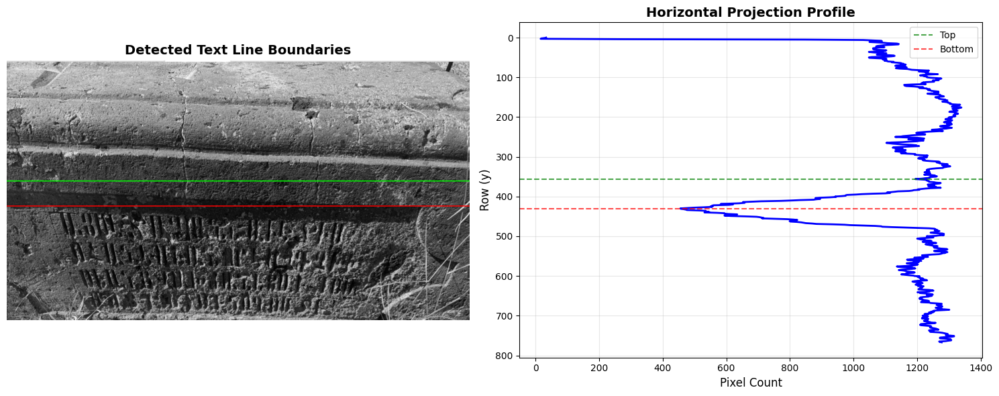

In [20]:
# Select first image for detailed visualization
if all_results:
    first_image_name = list(all_results.keys())[0]
    results = all_results[first_image_name]
    
    print(f"Detailed visualization for: {first_image_name}\n")
    
    # Step 2: Edge Detection
    print("Step 2: Vertical Edge Detection")
    show_images_grid(
        [results['original'], results['east_edges'], results['west_edges'], results['edges']],
        ['Original', 'East Edges', 'West Edges', 'Combined Edges'],
        cols=2, figsize=(12, 10)
    )
    
    # Step 3-4: Morphology and Denoising
    print("Steps 3-4: Morphological Enhancement and Denoising")
    show_images_grid(
        [results['edges'], results['morphed'], results['denoised']],
        ['Original Edges', 'After Morphology', 'After Denoising'],
        cols=3, figsize=(15, 5)
    )
    
    # Step 5: Bandpass Filter
    print("Step 5: Bandpass Filter")
    show_images_grid(
        [results['denoised'], results['bandpass']],
        ['Before Bandpass', 'After Bandpass'],
        cols=2, figsize=(12, 6)
    )
    
    # Step 8: Particle Analysis
    print("Step 8: Particle Analysis with Ellipse Fitting")
    show_images_grid(
        [results['bandpass'], results['ellipse_img']],
        [f'Bandpass Result', f'Fitted Ellipses ({len(results["ellipses"])} particles)'],
        cols=2, figsize=(12, 6)
    )
    
    # Step 9: Skeletonization
    print("Step 9: Skeletonization")
    show_images_grid(
        [results['bandpass'], results['skeleton']],
        ['Before Skeletonization', 'After Skeletonization'],
        cols=2, figsize=(12, 6)
    )
    
    # Step 12: Detected Lines
    print("Step 12: Detected Lines Overlay")
    show_images_grid(
        [results['original'], results['line_overlay']],
        ['Original Image', f'Detected Lines ({len(results["detected_lines"])} lines)'],
        cols=2, figsize=(12, 6)
    )
    
    # Step 13: Text Line Boundaries
    print("Step 13: Text Line Boundaries")
    show_images_grid(
        [results['original'], results['boundary_img']],
        ['Original Image', f'Text Line Boundaries ({len(results["boundaries"])} boundaries)'],
        cols=2, figsize=(12, 6)
    )
    
    # Projection Profile Visualization
    print("Step 13: Horizontal Projection Profile")
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Image with boundaries
    axes[0].imshow(results['boundary_img'])
    axes[0].set_title('Detected Text Line Boundaries', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Projection profile
    projection = results['projection']
    axes[1].plot(projection, range(len(projection)), 'b-', linewidth=2)
    axes[1].invert_yaxis()
    axes[1].set_xlabel('Pixel Count', fontsize=12)
    axes[1].set_ylabel('Row (y)', fontsize=12)
    axes[1].set_title('Horizontal Projection Profile', fontsize=14, fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    
    # Mark boundaries
    for i, (top, bottom) in enumerate(results['boundaries']):
        label_top = 'Top' if i == 0 else None
        label_bottom = 'Bottom' if i == 0 else None
        axes[1].axhline(top, color='green', linestyle='--', alpha=0.7, label=label_top)
        axes[1].axhline(bottom, color='red', linestyle='--', alpha=0.7, label=label_bottom)
    
    if results['boundaries']:
        axes[1].legend()
    
    plt.tight_layout()
    plt.show()

---
## Final Results Summary: All Images


Final Results: Comparison of All Images


Image1:


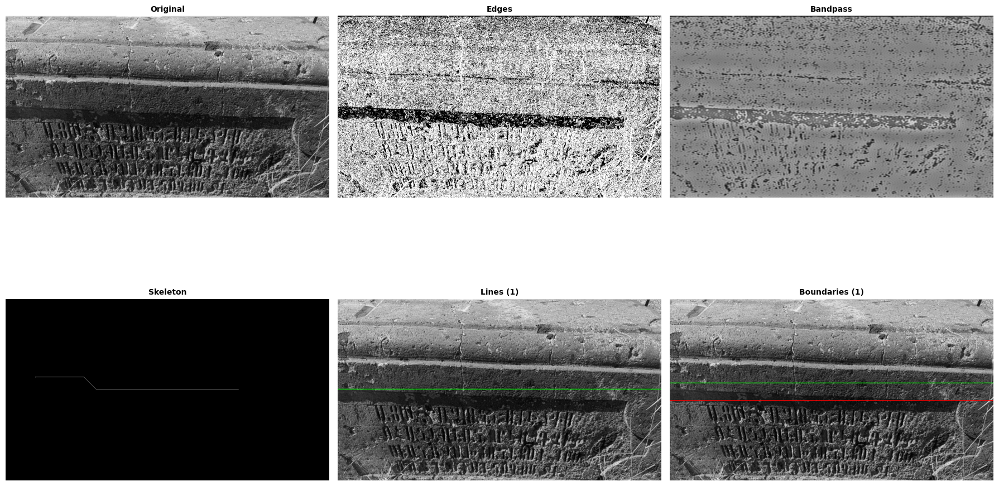


Image3:


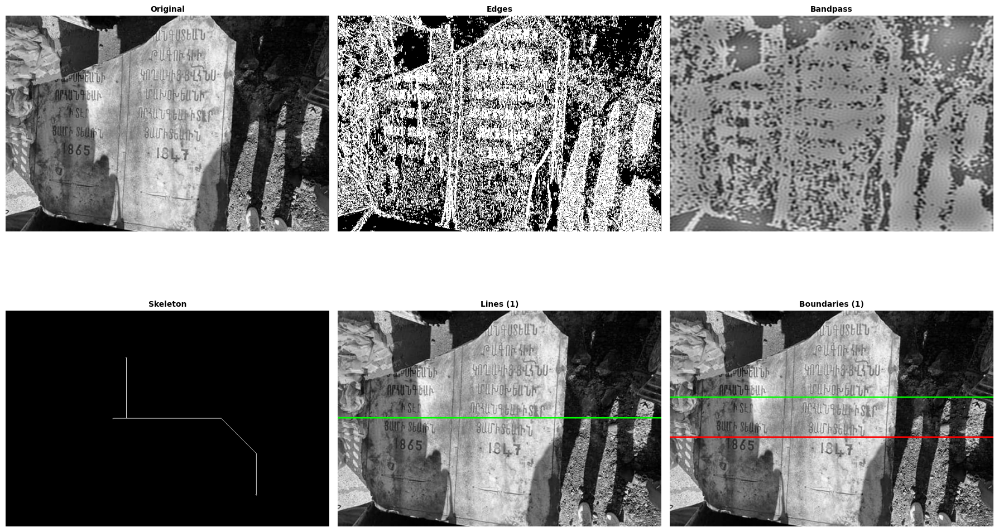


Image4:


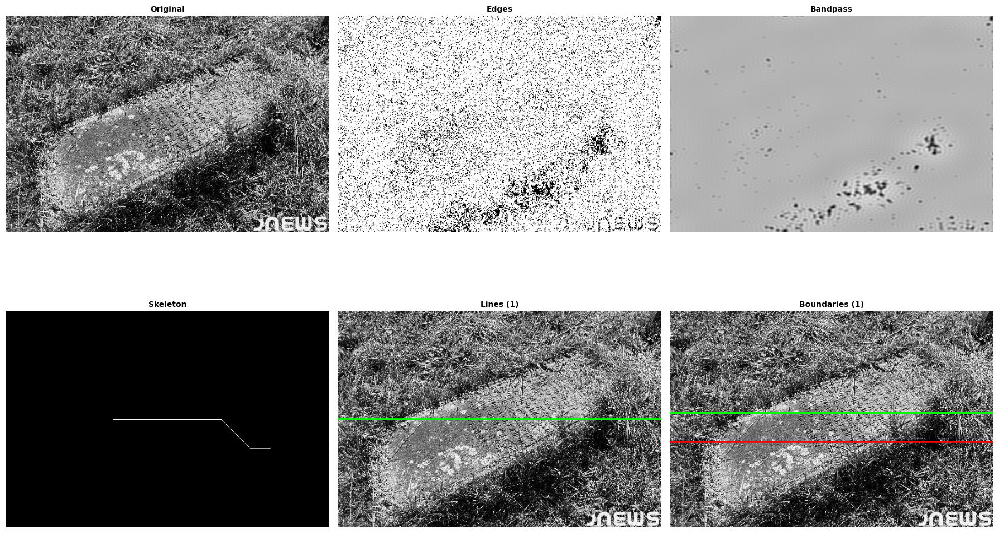


PIPELINE COMPLETE!

Results saved to: /Users/narekmeloyan/PycharmProjects/ImageProcessingProject1/Results

Folder structure:
  final_results: 3 files
  step0_preprocessing: 0 files
  step10_hough: 0 files
  step11_thresholding: 0 files
  step12_lines: 3 files
  step13_boundaries: 3 files
  step1_preprocessing: 0 files
  step2_edges: 9 files
  step3_morphology: 3 files
  step4_denoising: 3 files
  step5_bandpass: 3 files
  step6_masking: 3 files
  step7_second_bandpass: 0 files
  step8_particles: 3 files
  step9_skeleton: 3 files


In [21]:
# Create final comparison grid for all images
print("\nFinal Results: Comparison of All Images\n")

for image_name, results in all_results.items():
    print(f"\n{image_name}:")
    
    # Show key stages
    show_images_grid(
        [
            results['original'],
            results['edges'],
            results['bandpass'],
            results['skeleton'],
            results['line_overlay'],
            results['boundary_img']
        ],
        [
            'Original',
            'Edges',
            'Bandpass',
            'Skeleton',
            f'Lines ({len(results["detected_lines"])})',
            f'Boundaries ({len(results["boundaries"])})'
        ],
        cols=3, figsize=(18, 12)
    )
    
    # Save final comparison
    final_comparison = np.hstack([
        cv2.cvtColor(results['original'], cv2.COLOR_GRAY2RGB),
        results['line_overlay'],
        results['boundary_img']
    ])
    save_image(
        final_comparison,
        RESULTS_DIR / 'final_results' / f"{image_name}_comparison.png"
    )

print("\n" + "="*70)
print("PIPELINE COMPLETE!")
print("="*70)
print(f"\nResults saved to: {RESULTS_DIR.absolute()}")
print("\nFolder structure:")
for folder in sorted(RESULTS_DIR.iterdir()):
    if folder.is_dir():
        num_files = len(list(folder.glob('*.png')))
        print(f"  {folder.name}: {num_files} files")

---
## Statistics and Quality Metrics

In [22]:
# Compute statistics for all images
print("\n" + "="*70)
print("PROCESSING STATISTICS")
print("="*70 + "\n")

for image_name, results in all_results.items():
    print(f"{image_name}:")
    print(f"  Image size: {results['original'].shape}")
    print(f"  Edge pixels: {np.sum(results['edges'] > 0):,} ({np.sum(results['edges'] > 0) / results['edges'].size * 100:.2f}%)")
    print(f"  Particles detected: {len(results['particles'])}")
    print(f"  Lines detected: {len(results['detected_lines'])}")
    print(f"  Text line boundaries: {len(results['boundaries'])}")
    
    if results['detected_lines']:
        avg_votes = np.mean([line['votes'] for line in results['detected_lines']])
        print(f"  Average line confidence: {avg_votes:.1f} votes")
    
    print()


PROCESSING STATISTICS

Image1:
  Image size: (768, 1369)
  Edge pixels: 698,168 (66.40%)
  Particles detected: 0
  Lines detected: 1
  Text line boundaries: 1
  Average line confidence: 603.0 votes

Image3:
  Image size: (460, 690)
  Edge pixels: 169,374 (53.36%)
  Particles detected: 0
  Lines detected: 1
  Text line boundaries: 1
  Average line confidence: 230.0 votes

Image4:
  Image size: (427, 640)
  Edge pixels: 234,211 (85.70%)
  Particles detected: 158
  Lines detected: 1
  Text line boundaries: 1
  Average line confidence: 215.0 votes



---
## Parameter Tuning Section (Optional)

Uncomment and run to experiment with different parameter values.

In [23]:
# # Select an image for parameter tuning
# test_image_name = list(images.keys())[0]
# test_image = images[test_image_name]

# print(f"Parameter tuning for: {test_image_name}\n")

# # Test different edge thresholds
# print("Testing edge detection thresholds...")
# thresholds = [10, 20, 30, 40, 50, 60]
# edge_results = []
# edge_titles = []

# for thresh in thresholds:
#     _, _, edges = detect_vertical_edges(test_image, threshold=thresh)
#     edge_results.append(edges)
#     edge_pixels = np.sum(edges > 0)
#     edge_titles.append(f'Threshold={thresh}\n{edge_pixels:,} pixels')

# show_images_grid(edge_results, edge_titles, cols=3, figsize=(15, 10))

# # Test different bandpass parameters
# print("\nTesting bandpass filter parameters...")
# bandpass_results = []
# bandpass_titles = []

# # First process image to get denoised version
# _, _, edges = detect_vertical_edges(test_image, threshold=30)
# morphed = morphological_enhancement(edges)
# denoised = denoise_binary(morphed)

# for large in [20, 40, 60]:
#     for small in [2, 3, 5]:
#         bp = bandpass_filter(denoised, filter_large=large, filter_small=small)
#         bandpass_results.append(bp)
#         bandpass_titles.append(f'L={large}, S={small}')

# show_images_grid(bandpass_results, bandpass_titles, cols=3, figsize=(15, 12))

---
## Export Summary Report

In [24]:
# Create a text summary report
report_path = RESULTS_DIR / 'processing_report.txt'

with open(report_path, 'w') as f:
    f.write("Armenian Inscription Text Line Detection - Processing Report\n")
    f.write("="*70 + "\n\n")
    
    f.write("Parameters Used:\n")
    f.write("-"*70 + "\n")
    for key, value in PARAMS.items():
        f.write(f"  {key}: {value}\n")
    f.write("\n")
    
    f.write("Processing Results:\n")
    f.write("="*70 + "\n\n")
    
    for image_name, results in all_results.items():
        f.write(f"{image_name}:\n")
        f.write("-"*70 + "\n")
        f.write(f"  Image size: {results['original'].shape}\n")
        f.write(f"  Edge pixels: {np.sum(results['edges'] > 0):,}\n")
        f.write(f"  Particles detected: {len(results['particles'])}\n")
        f.write(f"  Lines detected: {len(results['detected_lines'])}\n")
        f.write(f"  Text line boundaries: {len(results['boundaries'])}\n")
        
        if results['detected_lines']:
            avg_votes = np.mean([line['votes'] for line in results['detected_lines']])
            f.write(f"  Average line confidence: {avg_votes:.1f} votes\n")
        
        f.write("\n  Detected line positions (rho values):\n")
        for i, line in enumerate(results['detected_lines'][:10], 1):  # Show first 10
            f.write(f"    Line {i}: rho={line['rho']:.1f}, theta={np.rad2deg(line['theta']):.1f}°, votes={line['votes']}\n")
        
        if len(results['detected_lines']) > 10:
            f.write(f"    ... and {len(results['detected_lines']) - 10} more lines\n")
        
        f.write("\n")

print(f"\nReport saved to: {report_path}")
print("\n" + "="*70)
print("NOTEBOOK EXECUTION COMPLETE!")
print("="*70)


Report saved to: Results/processing_report.txt

NOTEBOOK EXECUTION COMPLETE!


---
## Conclusion

This notebook successfully implements a 13-step pipeline for detecting text lines in Armenian stone inscriptions:

1. **Step 0-1:** Image loading and preprocessing
2. **Step 2:** Vertical edge detection using Sobel operators
3. **Step 3:** Morphological enhancement (dilation + erosion)
4. **Step 4:** Denoising with binary preservation
5. **Step 5:** Bandpass filtering in frequency domain
6. **Steps 6-7:** Binary masking (optional)
7. **Step 8:** Particle analysis with ellipse fitting
8. **Step 9:** Skeletonization
9. **Steps 10-11:** Hough transform for line detection
10. **Step 12:** Line overlay on original images
11. **Step 13:** Projection profile and boundary detection

**Results:**
- All intermediate images saved to organized folders
- Final results show detected text lines and boundaries
- Processing statistics documented in report

**Next Steps:**
1. Review results for each image
2. Tune parameters if needed for better detection
3. Convert successful algorithms to Java for final submission

**Reference:** Based on Burger & Burge, "Digital Image Processing" (2nd ed., 2016)